# Decision Trees on Donor Choose Dataset

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from chart_studio.plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

In [2]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)
project_data.project_is_approved.value_counts()

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


1    92706
0    16542
Name: project_is_approved, dtype: int64

In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [5]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))

In [6]:
sorted_cat_dict

{'Warmth': 1388,
 'Care_Hunger': 1388,
 'History_Civics': 5914,
 'Music_Arts': 10293,
 'AppliedLearning': 12135,
 'SpecialNeeds': 13642,
 'Health_Sports': 14223,
 'Math_Science': 41421,
 'Literacy_Language': 52239}

## 1.3 preprocessing of `project_subject_subcategories`

In [7]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

In [8]:
sorted_sub_cat_dict

{'Economics': 269,
 'CommunityService': 441,
 'FinancialLiteracy': 568,
 'ParentInvolvement': 677,
 'Extracurricular': 810,
 'Civics_Government': 815,
 'ForeignLanguages': 890,
 'NutritionEducation': 1355,
 'Warmth': 1388,
 'Care_Hunger': 1388,
 'SocialSciences': 1920,
 'PerformingArts': 1961,
 'CharacterEducation': 2065,
 'TeamSports': 2192,
 'Other': 2372,
 'College_CareerPrep': 2568,
 'Music': 3145,
 'History_Geography': 3171,
 'Health_LifeScience': 4235,
 'EarlyDevelopment': 4254,
 'ESL': 4367,
 'Gym_Fitness': 4509,
 'EnvironmentalScience': 5591,
 'VisualArts': 6278,
 'Health_Wellness': 10234,
 'AppliedSciences': 10816,
 'SpecialNeeds': 13642,
 'Literature_Writing': 22179,
 'Mathematics': 28074,
 'Literacy': 33700}

# 1.4 preprocessing of project grade categories


In [9]:
project_data['project_grade_category'].value_counts()

Grades PreK-2    44225
Grades 3-5       37137
Grades 6-8       16923
Grades 9-12      10963
Name: project_grade_category, dtype: int64

In [10]:
preprocessed_project_grade_categories= []
for grade_cat in tqdm(project_data["project_grade_category"]): 
    grade_cat = grade_cat.replace('-', '_')  #Replacing(-) with(_)
    grade_cat = grade_cat.replace('Grades', '') #Removing grades as it is redundant
    grad_cat = ' '.join(f for f in grade_cat.split())
    preprocessed_project_grade_categories.append(grad_cat.strip())

100%|██████████████████████████████████████████████████████████████████████| 109248/109248 [00:00<00:00, 622904.75it/s]


In [11]:
print(preprocessed_project_grade_categories[12])
print("="*50)
print(preprocessed_project_grade_categories[502])
print("="*50)
print(preprocessed_project_grade_categories[5002])
print("="*50)
print(preprocessed_project_grade_categories[50002])
print("="*50)
print(preprocessed_project_grade_categories[100013])
print("="*50)

6_8
6_8
6_8
3_5
PreK_2


# 1.5 preprocessing of teacher prefix

In [12]:
project_data['teacher_prefix'].value_counts()

Mrs.       57269
Ms.        38955
Mr.        10648
Teacher     2360
Dr.           13
Name: teacher_prefix, dtype: int64

<h2>Replacing Nan Values with maximum frequencies values i.e Mrs.</h2>

In [13]:
project_data['teacher_prefix'] = project_data['teacher_prefix'].fillna('Mrs.')

In [14]:
def replace_cate(lst):          # Removing (.) in Mrs. 
    return lst.replace('.','')
project_data['teacher_prefix']= project_data['teacher_prefix'].apply(replace_cate)

In [15]:
preprocessed_teacher_prefix = []
for teach_prefix in tqdm(project_data["teacher_prefix"]):
    preprocessed_teacher_prefix.append(teach_prefix.strip())

100%|█████████████████████████████████████████████████████████████████████| 109248/109248 [00:00<00:00, 2278156.69it/s]


In [16]:
print(preprocessed_teacher_prefix[1])
print("="*50)
print(preprocessed_teacher_prefix[50])
print("="*50)
project_data.teacher_prefix.value_counts()

Mr
Mrs


Mrs        57272
Ms         38955
Mr         10648
Teacher     2360
Dr            13
Name: teacher_prefix, dtype: int64

 # 1.6 Adding a new feature 
 Introducing New Features
Consider these set of features for Set 5 in Assignment:

categorical dataschool_state clean_categories....clean_subcategories....project_grade_category....teacher_prefix

numerical data quantity....teacher_number_of_previously_posted_projects....price

New Features

 sentiment score's of each of the essay : numerical data
 number of words in the title : numerical data
 number of words in the combine essays : numerical data

In [17]:
title_word_count = []

In [18]:
for a in project_data["project_title"] :
    b = len(a.split())
    title_word_count.append(b)

In [19]:
project_data["title_word_count"] = title_word_count

In [20]:
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,title_word_count
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,7
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,5
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,7
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs,KY,2016-10-06 21:16:17,Grades PreK-2,Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science,Literacy Mathematics,2
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs,TX,2016-07-11 01:10:09,Grades PreK-2,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science,Mathematics,3


# combining 4 essays into 1 essay

In [21]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

# Adding a new feature Number of words in essay

In [22]:
essay_word_count=[]

In [23]:
for ess in project_data["essay"] :
    c = len(ess.split())
    essay_word_count.append(c)

In [24]:
project_data["essay_word_count"] = essay_word_count

<h1>Computing Sentiment Score</h1>

In [25]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')
# import nltk
#nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

C:\Anaconda3\lib\site-packages\nltk\twitter\__init__.py:20: UserWarning:

The twython library has not been installed. Some functionality from the twitter package will not be available.



[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\honey\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
neg: 0.109, neu: 0.693, pos: 0.198, compound: 0.2023, 

In [26]:
SID = SentimentIntensityAnalyzer()
#There is NEGITIVE and POSITIVE and NEUTRAL and COMPUND SCORES
#http://www.nltk.org/howto/sentiment.html
    
negitive = []
positive = []
neutral = []
compound = []
for i in tqdm(project_data['essay']):
    j = SID.polarity_scores(i)['neg']
    k = SID.polarity_scores(i)['neu']
    l = SID.polarity_scores(i)['pos']
    m = SID.polarity_scores(i)['compound']
    negitive.append(j)
    positive.append(k)
    neutral.append(l)
    compound.append(m)

100%|█████████████████████████████████████████████████████████████████████████| 109248/109248 [16:08<00:00, 112.78it/s]


In [27]:
project_data['negitive'] = negitive
project_data['positive'] = positive
project_data['neutral'] = neutral
project_data['compound'] = compound

In [28]:
project_data.head(2)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_is_approved,clean_categories,clean_subcategories,title_word_count,essay,essay_word_count,negitive,positive,neutral,compound
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,0,Literacy_Language,ESL Literacy,7,My students are English learners that are work...,272,0.008,0.911,0.081,0.9611
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,1,History_Civics Health_Sports,Civics_Government TeamSports,5,Our students arrive to our school eager to lea...,221,0.037,0.851,0.112,0.9267


In [29]:
project_data.columns.values

array(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category',
       'project_title', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects',
       'project_is_approved', 'clean_categories', 'clean_subcategories',
       'title_word_count', 'essay', 'essay_word_count', 'negitive',
       'positive', 'neutral', 'compound'], dtype=object)

# Train Test split

In [30]:
# train test split using sklearn.model selection
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(project_data, project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'],random_state=25022001)
#X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train,random_state=25022001)

In [31]:
project_data.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_is_approved,clean_categories,clean_subcategories,title_word_count,essay,essay_word_count,negitive,positive,neutral,compound
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,0,Literacy_Language,ESL Literacy,7,My students are English learners that are work...,272,0.008,0.911,0.081,0.9611
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,1,History_Civics Health_Sports,Civics_Government TeamSports,5,Our students arrive to our school eager to lea...,221,0.037,0.851,0.112,0.9267
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,0,Health_Sports,Health_Wellness TeamSports,7,"\r\n\""True champions aren't always the ones th...",361,0.058,0.764,0.179,0.9950
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs,KY,2016-10-06 21:16:17,Grades PreK-2,Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,...,1,Literacy_Language Math_Science,Literacy Mathematics,2,I work at a unique school filled with both ESL...,213,0.052,0.733,0.214,0.9931
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs,TX,2016-07-11 01:10:09,Grades PreK-2,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",...,1,Math_Science,Mathematics,3,Our second grade classroom next year will be m...,234,0.016,0.897,0.087,0.9192


In [32]:
X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
#X_cv.drop(['project_is_approved'], axis=1, inplace=True)

In [33]:
X_train.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,title_word_count,essay,essay_word_count,negitive,positive,neutral,compound
41046,35767,p135014,292857bb10b18b1d61b9f7c2d6f8be41,Mrs,SC,2016-10-03 10:48:52,Grades PreK-2,iSucceed with iPads,I teach in a suburban area of upstate South Ca...,There are so many apps available for students ...,...,4,Literacy_Language AppliedLearning,Literature_Writing ParentInvolvement,3,I teach in a suburban area of upstate South Ca...,235,0.008,0.881,0.111,0.9763
81320,153328,p082885,83993ecaecbe4670a8836aeab839f3e8,Ms,LA,2016-11-07 10:21:44,Grades 6-8,Creating Future Scientists One Word at a Time,These young scientists are all New Orleans nat...,Children from lower incomes will have been exp...,...,1,Math_Science,AppliedSciences,8,These young scientists are all New Orleans nat...,229,0.029,0.845,0.126,0.9726


# 1.8 Text preprocessing

In [34]:
# printing some random reviews

print(X_train['essay'].values[0])
print("="*50)
print(X_train['essay'].values[500])
print("="*50)

I teach in a suburban area of upstate South Carolina at a large primary school of 740 students! In my classroom, I have 25 motivated and wonderfully unique students who learn in many different ways.\r\n\r\nOur classroom is filled with love, laughter, and learning. Through small group and whole group lessons, games, activities, and projects, the students are able to achieve goals based on their individual needs.\r\n\r\nWe are continuing to integrate technology to provide students with 21st century skills they will need to be successful in the world.There are so many apps available for students at the K-2 level.  For example, there are apps to read books picked specifically for them such as Raz-Kids and Epic!  The students in our class have a wide range of interests and levels and these apps provide another reading opportunity outside of the books in the classroom library. Using an app called Seesaw, students will be keeping an online journal of things completed in class and documenting 

In [35]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [36]:
sent = decontracted(X_train['essay'].values[20000])
print(sent)
print("="*50)

My students are awesome! They are working so hard this year to complete all of their projects.  Our community is classified as high poverty; our students do not have many resources outside of the school doors. They are very grateful for any technology or helpful aides supplied to them to enhance their learning environment.  \r\n\r\nOur Business & Technology classes, as well as the high school Yearbook staff, are talented kiddos who, when given the right tools, can be very creative with their designs! They have fantastic ideas and share many \"aha\" moments in the classroom.My classroom is in desperate need of help with hearing sound related to our graphic design projects. Our projector system is not the best, and it is nearly impossible for students to hear the audio that they arrange with their designs when presenting to the class. They become discouraged, thinking they did not successfully complete their project when it comes time to share with their classmates and the audio is very 

In [37]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My students are awesome! They are working so hard this year to complete all of their projects.  Our community is classified as high poverty; our students do not have many resources outside of the school doors. They are very grateful for any technology or helpful aides supplied to them to enhance their learning environment.      Our Business & Technology classes, as well as the high school Yearbook staff, are talented kiddos who, when given the right tools, can be very creative with their designs! They have fantastic ideas and share many  aha  moments in the classroom.My classroom is in desperate need of help with hearing sound related to our graphic design projects. Our projector system is not the best, and it is nearly impossible for students to hear the audio that they arrange with their designs when presenting to the class. They become discouraged, thinking they did not successfully complete their project when it comes time to share with their classmates and the audio is very low. C

In [38]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My students are awesome They are working so hard this year to complete all of their projects Our community is classified as high poverty our students do not have many resources outside of the school doors They are very grateful for any technology or helpful aides supplied to them to enhance their learning environment Our Business Technology classes as well as the high school Yearbook staff are talented kiddos who when given the right tools can be very creative with their designs They have fantastic ideas and share many aha moments in the classroom My classroom is in desperate need of help with hearing sound related to our graphic design projects Our projector system is not the best and it is nearly impossible for students to hear the audio that they arrange with their designs when presenting to the class They become discouraged thinking they did not successfully complete their project when it comes time to share with their classmates and the audio is very low Currently we have volume o

In [39]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

 # 1.8.1 Preprocessesd training data - Text


In [40]:
from tqdm import tqdm
def preprocess_textual(row_value):
    preprocessed_train = []
    for sentences in tqdm(row_value):
        sent = decontracted(sentences)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\"', ' ')
        sent = sent.replace('\\n', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        # https://gist.github.com/sebleier/554280
        sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
        preprocessed_train.append(sent.lower().strip())
    return preprocessed_train

In [41]:
preprocessed_essays_train=preprocess_textual(X_train['essay'].values)

100%|██████████████████████████████████████████████████████████████████████████| 73196/73196 [00:35<00:00, 2035.61it/s]


In [42]:
preprocessed_essays_test=preprocess_textual(X_test['essay'].values)

100%|██████████████████████████████████████████████████████████████████████████| 36052/36052 [00:17<00:00, 2074.99it/s]


In [43]:
preprocessed_essays_test

['students diverse culturally academically class work community celebrate differences cultures share ideas traditions cultures work together succeed socially emotionally academically many students english language learners work really hard achieve individual goals many students families not speak english school works hard students succeed prepare college school also works parents help children succeed life education students need noise canceling headphones help concentrate students need quiet environment help concentrate work students learn multiple environments students like noise others need quiet headphones great tool help noise level noise canceling headphones solution help students focus many students find hard concentrate especially sounds distracting times using noise cancelling headphones helps students block external noise concentrate need learn nannan',
 'students 6th 7th 8th graders attending public middle school many recent arrivals united states come classroom no english o

# 1.8.3 Preprocessed cross validation data


In [44]:
#preprocessed_essays_cv=preprocess_textual(X_cv['essay'].values)

# 1.9 preprocessing of project title

In [45]:
# printing some randomproject titles.
print(project_data['project_title'].values[1])
print("="*50)
print(project_data['project_title'].values[1501])
print("="*50)
print(project_data['project_title'].values[10001])
print("="*50)
print(project_data['project_title'].values[20001])
print("="*50)

Wanted: Projector for Hungry Learners
Making Every Day at School Count
Becoming 'Readerly' Readers
The Beautiful Life of a Butterfly


In [46]:
title = decontracted(X_train['project_title'].values[2000])

# 1.9.1 Preprocessing of Project Title(Train)

In [47]:
preprocessed_titles_train=preprocess_textual(X_train["project_title"].values)

100%|█████████████████████████████████████████████████████████████████████████| 73196/73196 [00:01<00:00, 45656.40it/s]


# 1.9.2 Preprocessing of Project Title(Test)

In [48]:
preprocessed_titles_test=preprocess_textual(X_test["project_title"])

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 41967.85it/s]


In [49]:
preprocessed_titles_test[10]

'chromebooks empower students 21st century learning'

# 1.9.2 Preprocessing of Project Title(CV)

In [50]:
#preprocessed_titles_cv=preprocess_textual(X_cv["project_title"])

In [51]:
#preprocessed_titles_cv[10]

## 1.5 Preparing data for models

In [52]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'title_word_count', 'essay',
       'essay_word_count', 'negitive', 'positive', 'neutral', 'compound'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

In [53]:
project_data.head(10)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_is_approved,clean_categories,clean_subcategories,title_word_count,essay,essay_word_count,negitive,positive,neutral,compound
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,0,Literacy_Language,ESL Literacy,7,My students are English learners that are work...,272,0.008,0.911,0.081,0.9611
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,1,History_Civics Health_Sports,Civics_Government TeamSports,5,Our students arrive to our school eager to lea...,221,0.037,0.851,0.112,0.9267
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,0,Health_Sports,Health_Wellness TeamSports,7,"\r\n\""True champions aren't always the ones th...",361,0.058,0.764,0.179,0.9950
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs,KY,2016-10-06 21:16:17,Grades PreK-2,Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,...,1,Literacy_Language Math_Science,Literacy Mathematics,2,I work at a unique school filled with both ESL...,213,0.052,0.733,0.214,0.9931
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs,TX,2016-07-11 01:10:09,Grades PreK-2,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",...,1,Math_Science,Mathematics,3,Our second grade classroom next year will be m...,234,0.016,0.897,0.087,0.9192
5,141660,p154343,a50a390e8327a95b77b9e495b58b9a6e,Mrs,FL,2017-04-08 22:40:43,Grades 3-5,Flexible Seating for Mrs. Jarvis' Terrific Thi...,I will be moving from 2nd grade to 3rd grade a...,These flexible seating options will allow my s...,...,1,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,8,I will be moving from 2nd grade to 3rd grade a...,291,0.077,0.777,0.146,0.9553
6,21147,p099819,9b40170bfa65e399981717ee8731efc3,Mrs,CT,2017-02-17 19:58:56,Grades 6-8,Chromebooks for Special Education Reading Program,My students are a dynamic and very energetic g...,My students are an engaging and active group o...,...,1,Literacy_Language SpecialNeeds,Literacy SpecialNeeds,6,My students are a dynamic and very energetic g...,196,0.028,0.800,0.172,0.9815
7,94142,p092424,5bfd3d12fae3d2fe88684bbac570c9d2,Ms,GA,2016-09-01 00:02:15,Grades 3-5,It's the 21st Century,Not only do our students struggle with poverty...,"My students need 4 iPads, the latest technolog...",...,1,Math_Science,Mathematics,4,Not only do our students struggle with poverty...,301,0.019,0.831,0.149,0.9929
8,112489,p045029,487448f5226005d08d36bdd75f095b31,Mrs,SC,2016-09-25 17:00:26,Grades PreK-2,Targeting More Success in Class,My students are enthusiastic and inquisitive l...,My second graders need extra activity time dur...,...,1,Health_Sports,Health_Wellness,5,My students are enthusiastic and inquisitive l...,302,0.007,0.743,0.250,0.9975
9,158561,p001713,140eeac1885c820ad5592a409a3a8994,Ms,NC,2016-11-17 18:18:56,Grades PreK-2,Just For the Love of Reading--\r\nPure Pleasure,Over 95% of my students are on free or reduced...,Reading is Fundamental! My students will read ...,...,1,Literacy_Language,Literacy Literature_Writing,7,Over 95% of my students are on free or reduced...,235,0.051,0.684,0.266,0.9962


### 1.5.1 Vectorizing Categorical data

# One hot Categorical (train,test,CV)

In [54]:
# we use count vectorizer to convert the values into one 
# Vectorizing Clean Categories 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)

vectorizer.fit(X_train['clean_categories'].values)
train_categories_one_hot = vectorizer.fit_transform(X_train['clean_categories'].values)
test_categories_one_hot = vectorizer.transform(X_test['clean_categories'].values)
#cv_categories_one_hot = vectorizer.transform(X_cv['clean_categories'].values)

cat_feat = vectorizer.get_feature_names()   #For Decision Tree
print(cat_feat)
print("Shape of  Train matrix after one hot encodig ",train_categories_one_hot.shape)
print("Shape of  Test matrix after one hot encodig ",test_categories_one_hot.shape)
#print("Shape of  cv  matrix after one hot encodig ",cv_categories_one_hot.shape)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of  Train matrix after one hot encodig  (73196, 9)
Shape of  Test matrix after one hot encodig  (36052, 9)


# one hot vector for clean subcategories (train ,test,cv)

In [55]:
# we use count vectorizer to convert the values into one 

vectorizer_sub_proj = CountVectorizer(min_df=10,ngram_range=(1,1), max_features=5000)
vectorizer_sub_proj.fit(X_train['clean_subcategories'].values)

sub_categories_one_hot_train = vectorizer_sub_proj.transform(X_train['clean_subcategories'].values)
sub_categories_one_hot_test = vectorizer_sub_proj.transform(X_test['clean_subcategories'].values)
#sub_categories_one_hot_cv = vectorizer_sub_proj.transform(X_cv['clean_subcategories'].values)
sub_cat_feat = vectorizer_sub_proj.get_feature_names()

print(vectorizer_sub_proj.get_feature_names())

print("Shape of matrix of Train data after one hot encoding ",sub_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",sub_categories_one_hot_test.shape)
#print("Shape of matrix of Cross Validation data after one hot encoding ",sub_categories_one_hot_cv.shape)

['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']
Shape of matrix of Train data after one hot encoding  (73196, 30)
Shape of matrix of Test data after one hot encoding  (36052, 30)


In [56]:
#sub_categories_one_hot_cv[0].toarray()

In [57]:
vectorizer_sub_proj.vocabulary_

{'literature_writing': 18,
 'parentinvolvement': 23,
 'appliedsciences': 0,
 'mathematics': 19,
 'literacy': 17,
 'charactereducation': 2,
 'college_careerprep': 4,
 'earlydevelopment': 6,
 'environmentalscience': 8,
 'civics_government': 3,
 'history_geography': 16,
 'health_wellness': 15,
 'gym_fitness': 13,
 'teamsports': 27,
 'esl': 9,
 'specialneeds': 26,
 'music': 20,
 'performingarts': 24,
 'health_lifescience': 14,
 'foreignlanguages': 12,
 'visualarts': 28,
 'other': 22,
 'nutritioneducation': 21,
 'socialsciences': 25,
 'financialliteracy': 11,
 'extracurricular': 10,
 'economics': 7,
 'communityservice': 5,
 'warmth': 29,
 'care_hunger': 1}

# One hot vector for school states(train,test,cv)

In [58]:
my_counter = Counter()
for state in project_data['school_state'].values:
    my_counter.update(state.split())

In [59]:
school_state_cat_dict = dict(my_counter)
sorted_school_state_cat_dict = dict(sorted(school_state_cat_dict.items(), key=lambda kv: kv[1]))

In [60]:
## Using count vectorizer to convert the values into one hot encoded features

vectorizer_states = CountVectorizer(min_df=10,ngram_range=(1,1), max_features=5000)
vectorizer_states.fit(X_train['school_state'].values)

school_state_categories_one_hot_train = vectorizer_states.transform(X_train['school_state'].values)
school_state_categories_one_hot_test = vectorizer_states.transform(X_test['school_state'].values)
#school_state_categories_one_hot_cv = vectorizer_states.transform(X_cv['school_state'].values)
school_feat=vectorizer_states.get_feature_names()
print(vectorizer_states.get_feature_names())

print("Shape of matrix of Train data after one hot encoding ",school_state_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",school_state_categories_one_hot_test.shape)
#print("Shape of matrix of Cross Validation data after one hot encoding ",school_state_categories_one_hot_cv.shape)

['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']
Shape of matrix of Train data after one hot encoding  (73196, 51)
Shape of matrix of Test data after one hot encoding  (36052, 51)


# one hot vector for Project grade category (train,test,cv)


In [61]:
my_counter = Counter()
for project_grade in preprocessed_project_grade_categories:
    my_counter.update(project_grade.split())

In [62]:
project_grade_cat_dict = dict(my_counter)
sorted_project_grade_cat_dict = dict(sorted(project_grade_cat_dict.items(), key=lambda kv: kv[1]))

In [63]:
## we use count vectorizer to convert the values into one hot encoded features
vectorizer_grade = CountVectorizer(min_df=10,ngram_range=(1,1), max_features=5000)
vectorizer_grade.fit(X_train['project_grade_category'].values)

project_grade_categories_one_hot_train = vectorizer_grade.transform(X_train['project_grade_category'].values)
project_grade_categories_one_hot_test = vectorizer_grade.transform(X_test['project_grade_category'].values)
#project_grade_categories_one_hot_cv = vectorizer_grade.transform(X_cv['project_grade_category'].values)
grade_feat=vectorizer_grade.get_feature_names()
print(vectorizer_grade.get_feature_names())

print("Shape of matrix of Train data after one hot encoding ",project_grade_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",project_grade_categories_one_hot_test.shape)
#print("Shape of matrix of Cross Validation data after one hot encoding ",project_grade_categories_one_hot_cv.shape)

['12', 'grades', 'prek']
Shape of matrix of Train data after one hot encoding  (73196, 3)
Shape of matrix of Test data after one hot encoding  (36052, 3)


# One hot vector for teacher prefix(train,test,cv)


In [64]:
vectorizer_teacher = CountVectorizer()
vectorizer_teacher.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
teacher_prefix_categories_one_hot_train = vectorizer_teacher.transform(X_train['teacher_prefix'].values)
#teacher_prefix_categories_one_hot_cv = vectorizer_teacher.transform(X_cv['teacher_prefix'].values)
teacher_prefix_categories_one_hot_test = vectorizer_teacher.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print("Shape of matrix of Train data after one hot encoding",teacher_prefix_categories_one_hot_train.shape, y_train.shape)
#print("Shape of matrix of cv data after one hot encoding",teacher_prefix_categories_one_hot_cv.shape, y_cv.shape)
print("Shape of matrix of Test data after one hot encoding",teacher_prefix_categories_one_hot_test.shape, y_test.shape)
teacher_feat=vectorizer_teacher.get_feature_names()
print(vectorizer_teacher.get_feature_names())
print("="*100)

After vectorizations
Shape of matrix of Train data after one hot encoding (73196, 5) (73196,)
Shape of matrix of Test data after one hot encoding (36052, 5) (36052,)
['dr', 'mr', 'mrs', 'ms', 'teacher']


# 1.11 Vectorizing text data


# TFIDF

### tfidf(train essays)

In [65]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_tfidf_essay = TfidfVectorizer(min_df=10,max_features=5000) #Considering top 5000 features
vectorizer_tfidf_essay.fit(preprocessed_essays_train)

text_tfidf_train = vectorizer_tfidf_essay.transform(preprocessed_essays_train)
print("Shape of matrix after TfidfVectorizer ",text_tfidf_train.shape)

Shape of matrix after TfidfVectorizer  (73196, 5000)


### tfidf(test essays)

In [66]:
text_tfidf_test = vectorizer_tfidf_essay.transform(preprocessed_essays_test)
print("Shape of matrix after TfidfVectorizer ",text_tfidf_test.shape)

Shape of matrix after TfidfVectorizer  (36052, 5000)


### tfidf(cv essays)

In [67]:
#text_tfidf_cv = vectorizer_tfidf_essay.transform(preprocessed_essays_cv)
#print("Shape of matrix after TfidfVectorizer ",text_tfidf_cv.shape)

## tfidf(train Titles)

In [68]:
vectorizer_tfidf_titles = TfidfVectorizer(min_df=10)

vectorizer_tfidf_titles.fit(preprocessed_titles_train)
title_tfidf_train = vectorizer_tfidf_titles.transform(preprocessed_titles_train)
print("Shape of matrix after TfidfVectorizer ",title_tfidf_train.shape)

Shape of matrix after TfidfVectorizer  (73196, 2546)


### tfidf(test titles)

In [69]:
title_tfidf_test = vectorizer_tfidf_titles.transform(preprocessed_titles_test)
print("Shape of matrix after TfidfVectorizer ",title_tfidf_test.shape)

Shape of matrix after TfidfVectorizer  (36052, 2546)


### tfidf(cv titles)


In [70]:
#title_tfidf_cv = vectorizer_tfidf_titles.transform(preprocessed_titles_cv)
#print("Shape of matrix after TfidfVectorizer ",title_tfidf_cv.shape)

## 1.5.2.3 Using Pretrained Models: TFIDF Weighted W2V

In [71]:

# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

## train essays

In [72]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [73]:
def tfidfWV(preprocessed_data):
    # average Word2Vec
    # compute average word2vec for each review.
    tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_data): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_vectors.append(vector)
    print("The length of TFIDF word to vec is ", len(tfidf_w2v_vectors))
    print("The length of TFIDF word to vec of index 0 is ",len(tfidf_w2v_vectors[0]))
    return tfidf_w2v_vectors

In [74]:
tfidf_w2v_vectors_train=tfidfWV(preprocessed_essays_train)

100%|███████████████████████████████████████████████████████████████████████████| 73196/73196 [01:55<00:00, 632.87it/s]

The length of TFIDF word to vec is  73196
The length of TFIDF word to vec of index 0 is  300


## Test essays

In [75]:
tfidf_w2v_vectors_test=tfidfWV(preprocessed_essays_test)

100%|███████████████████████████████████████████████████████████████████████████| 36052/36052 [00:57<00:00, 626.89it/s]

The length of TFIDF word to vec is  36052
The length of TFIDF word to vec of index 0 is  300


## cv essays

In [76]:
#tfidf_w2v_vectors_cv = tfidfWV(preprocessed_essays_cv)

## train titles

In [77]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_titles_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [78]:
tfidf_w2v_vectors_titles_train = tfidfWV(preprocessed_titles_train)

100%|█████████████████████████████████████████████████████████████████████████| 73196/73196 [00:01<00:00, 42979.11it/s]

The length of TFIDF word to vec is  73196
The length of TFIDF word to vec of index 0 is  300


## test titles

In [79]:
tfidf_w2v_vectors_titles_test = tfidfWV(preprocessed_titles_test)

100%|█████████████████████████████████████████████████████████████████████████| 36052/36052 [00:00<00:00, 43146.44it/s]

The length of TFIDF word to vec is  36052
The length of TFIDF word to vec of index 0 is  300


## cv titles

In [80]:
#tfidf_w2v_vectors_titles_cv = tfidfWV(preprocessed_titles_cv)

# 1.12  Vectorizing Numerical features

Various numerical feautures are :

1.Price

2.Quantity

3.Number of Projects previously proposed by Teacher

4.Title word Count ( introduced by us)

5.Essay word Count ( introduced by us)

6.Negative Intensity

7.Positive Intensity

8.Neutral Intensity

In [81]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(4)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21
2,p000003,298.97,4
3,p000004,1113.69,98


In [82]:
# join two dataframes in python: 
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left')
#X_cv = pd.merge(X_cv, price_data, on='id', how='left')

In [83]:
from sklearn.preprocessing import Normalizer

normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

price_for_test=X_test['price']    #Box Plot Purpose

normalizer.fit(X_train['price'].values.reshape(1,-1))

price_train = normalizer.transform(X_train['price'].values.reshape(-1,1))
#price_cv = normalizer.transform(X_cv['price'].values.reshape(-1,1))
price_test = normalizer.transform(X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print(price_train.shape, y_train.shape)
#print(price_cv.shape, y_cv.shape)
print(price_test.shape, y_test.shape)
print("="*100)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


## 2) Quantity

In [84]:
normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['quantity'].values.reshape(1,-1))

quantity_train = normalizer.transform(X_train['quantity'].values.reshape(-1,1))
#quantity_cv = normalizer.transform(X_cv['quantity'].values.reshape(-1,1))
quantity_test = normalizer.transform(X_test['quantity'].values.reshape(-1,1))

print("After vectorizations")
print(quantity_train.shape, y_train.shape)
#print(quantity_cv.shape, y_cv.shape)
print(quantity_test.shape, y_test.shape)
print("="*100)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


## 3)  Number of Projects previously proposed by Teacher

In [85]:
normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

prev_projects_train = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
#prev_projects_cv = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
number_of_previously_posted_projects_dtrees=X_test['teacher_number_of_previously_posted_projects']
prev_projects_test = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After vectorizations")
print(prev_projects_train.shape, y_train.shape)
#print(prev_projects_cv.shape, y_cv.shape)
print(prev_projects_test.shape, y_test.shape)
print("="*100)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


## 4) title word count

In [86]:
normalizer = Normalizer()

normalizer.fit(X_train['title_word_count'].values.reshape(1,-1))

title_word_count_train = normalizer.transform(X_train['title_word_count'].values.reshape(-1,1))
#title_word_count_cv = normalizer.transform(X_cv['title_word_count'].values.reshape(-1,1))
title_word_count_test = normalizer.transform(X_test['title_word_count'].values.reshape(-1,1))

print("After vectorizations")
print(title_word_count_train.shape, y_train.shape)
#print(title_word_count_cv.shape, y_cv.shape)
print(title_word_count_test.shape, y_test.shape)
print("="*100)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


## 5) essay word count

In [87]:
normalizer = Normalizer()

normalizer.fit(X_train['essay_word_count'].values.reshape(1,-1))

essay_word_count_train = normalizer.transform(X_train['essay_word_count'].values.reshape(-1,1))
#essay_word_count_cv = normalizer.transform(X_cv['essay_word_count'].values.reshape(-1,1))
essay_word_count_test = normalizer.transform(X_test['essay_word_count'].values.reshape(-1,1))

print("After vectorizations")
print(essay_word_count_train.shape, y_train.shape)
#print(essay_word_count_cv.shape, y_cv.shape)
print(essay_word_count_test.shape, y_test.shape)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


# 6) Positive Intensity

In [88]:
normalizer = Normalizer()

normalizer.fit(X_train['positive'].values.reshape(1,-1))

positive_intensity_train = normalizer.transform(X_train['positive'].values.reshape(-1,1))
#positive_intensity_cv = normalizer.transform(X_cv['positive'].values.reshape(-1,1))
positive_intensity_test = normalizer.transform(X_test['positive'].values.reshape(-1,1))

print("After vectorizations")
print(positive_intensity_train.shape, y_train.shape)
#print(positive_intensity_cv.shape, y_cv.shape)
print(positive_intensity_test.shape, y_test.shape)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


# 7) Negative Intensity

In [89]:
normalizer = Normalizer()

normalizer.fit(X_train['negitive'].values.reshape(1,-1))

negative_intensity_train = normalizer.transform(X_train['negitive'].values.reshape(-1,1))
#negative_intensity_cv = normalizer.transform(X_cv['negitive'].values.reshape(-1,1))
negative_intensity_test = normalizer.transform(X_test['negitive'].values.reshape(-1,1))

print("After vectorizations")
print(negative_intensity_train.shape, y_train.shape)
#print(negative_intensity_cv.shape, y_cv.shape)
print(negative_intensity_test.shape, y_test.shape)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


# 8) Neutral Intensity

In [90]:
normalizer = Normalizer()

normalizer.fit(X_train['negitive'].values.reshape(1,-1))

neutral_intensity_train = normalizer.transform(X_train['neutral'].values.reshape(-1,1))
#neutral_intensity_cv = normalizer.transform(X_cv['neutral'].values.reshape(-1,1))
neutral_intensity_test = normalizer.transform(X_test['neutral'].values.reshape(-1,1))

print("After vectorizations")
print(neutral_intensity_train.shape, y_train.shape)
#print(neutral_intensity_cv.shape, y_cv.shape)
print(neutral_intensity_test.shape, y_test.shape)

After vectorizations
(73196, 1) (73196,)
(36052, 1) (36052,)


<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 3, 10, 30], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>min_sample_split</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
        Make sure that you are using predict_proba method to calculate AUC curves, because AUC is calcualted on class probabilities and not on class labels.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   

In [91]:
from scipy.sparse import hstack
X_train = hstack((train_categories_one_hot , sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train,
                  teacher_prefix_categories_one_hot_train,text_tfidf_train,title_tfidf_train, quantity_train,
                  prev_projects_train, price_train,title_word_count_train, 
                  essay_word_count_train, positive_intensity_train, negative_intensity_train,
                  neutral_intensity_train)).tocsr()
print(X_train.shape, y_train.shape)
print(type(X_train))

(73196, 7652) (73196,)
<class 'scipy.sparse.csr.csr_matrix'>


In [92]:
X_test = hstack((test_categories_one_hot ,sub_categories_one_hot_test,school_state_categories_one_hot_test,project_grade_categories_one_hot_test,
                 teacher_prefix_categories_one_hot_test,text_tfidf_test, title_tfidf_test, quantity_test,
                  prev_projects_test, price_test,title_word_count_test, 
                  essay_word_count_test, title_word_count_test, negative_intensity_test,
                  neutral_intensity_test)).tocsr()
print(X_test.shape, y_test.shape)
print(type(X_test))

(36052, 7652) (36052,)
<class 'scipy.sparse.csr.csr_matrix'>


In [93]:
print(test_categories_one_hot)

  (0, 8)	1
  (1, 4)	1
  (1, 7)	1
  (2, 3)	1
  (2, 8)	1
  (3, 8)	1
  (4, 5)	1
  (5, 3)	1
  (6, 7)	1
  (7, 8)	1
  (8, 3)	1
  (9, 4)	1
  (10, 2)	1
  (10, 7)	1
  (11, 7)	1
  (11, 8)	1
  (12, 3)	1
  (12, 8)	1
  (13, 5)	1
  (13, 7)	1
  (14, 6)	1
  (15, 8)	1
  (16, 8)	1
  (17, 7)	1
  (17, 8)	1
  :	:
  (36034, 4)	1
  (36034, 5)	1
  (36035, 8)	1
  (36036, 8)	1
  (36037, 5)	1
  (36037, 6)	1
  (36038, 7)	1
  (36039, 7)	1
  (36040, 7)	1
  (36040, 8)	1
  (36041, 8)	1
  (36042, 8)	1
  (36043, 4)	1
  (36043, 7)	1
  (36044, 8)	1
  (36045, 7)	1
  (36045, 8)	1
  (36046, 8)	1
  (36047, 3)	1
  (36047, 7)	1
  (36048, 6)	1
  (36049, 8)	1
  (36050, 5)	1
  (36050, 7)	1
  (36051, 7)	1


# We don't need CV data since it is automatically done by the optimization function of python

In [94]:
# X_cv = hstack((cv_categories_one_hot ,sub_categories_one_hot_cv,school_state_categories_one_hot_cv,project_grade_categories_one_hot_cv,
#                  teacher_prefix_categories_one_hot_cv,text_tfidf_cv, title_tfidf_cv, quantity_cv,
#                  prev_projects_cv, price_cv, title_word_count_cv, 
#                   essay_word_count_cv ,positive_intensity_cv, negative_intensity_cv,
#                   neutral_intensity_cv)).tocsr()
# print(X_cv.shape, y_cv.shape)
# print(type(X_cv))

## Hyperparameter Tuning

In [95]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
DT = DecisionTreeClassifier()

parameters = {'max_depth': [1, 3, 10, 30], 'min_samples_split':  [5, 10, 100, 500]}

classifier_5 = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc',verbose=10,n_jobs=-1)
classifier_5.fit(X_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   

GridSearchCV(cv=3, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [1, 3, 10, 30], 'min_samples_split': [5, 10, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [96]:
max_depth_best_param=classifier_5.best_params_['max_depth']
min_samples_split_best_param=classifier_5.best_params_['min_samples_split']
print(classifier_5.best_params_)

{'max_depth': 10, 'min_samples_split': 500}


In [97]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [98]:
x1 = [5, 10, 100, 500] #min_sample_split
y1 = [1, 3, 10, 30]#max_depth
z1 = classifier_5.cv_results_['mean_test_score']

x2 = [5, 10, 100, 500] #min_sample_split
y2 = [1, 3, 10, 30] #max_depth
z2 = classifier_5.cv_results_['mean_train_score']


In [99]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'Cross Validation')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Train')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_sample_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [100]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs
    
    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

In [101]:
def predict(proba, threshould, fpr, tpr):
    t = threshould[np.argmax(fpr*(1-tpr))]
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    global predictions1
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    predictions1 = predictions
    return predictions

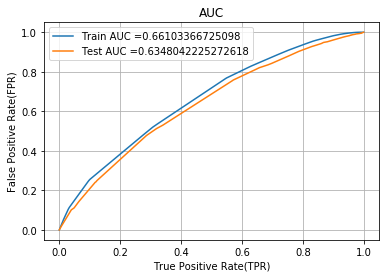

In [102]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier(max_depth = max_depth_best_param, min_samples_split = min_samples_split_best_param)
classifier.fit(X_train, y_train)

y_train_pred = batch_predict(classifier,X_train)    
y_test_pred = batch_predict(classifier,X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

# Confusion Matrix For Train & Test Data

For the Train Data
the maximum value of tpr*(1-fpr) 0.3634881598116023 for threshold 0.855
For the Test Data
the maximum value of tpr*(1-fpr) 0.34960540350877234 for threshold 0.855


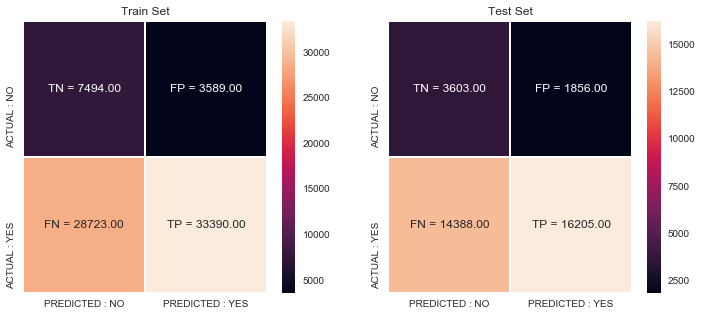

In [103]:
#https://www.quantinsti.com/blog/creating-heatmap-using-python-seaborn
import seaborn as sns; sns.set()
print("For the Train Data")
con_m_train = confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr))
print("For the Test Data")
con_m_test = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr))

key = (np.asarray([['TN','FP'], ['FN', 'TP']]))
fig, ax = plt.subplots(1,2, figsize=(12,5)) 

labels_train = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_m_train.flatten())])).reshape(2,2)
labels_test = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_m_test.flatten())])).reshape(2,2)

sns.heatmap(con_m_train, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'], yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_train, fmt = '', ax=ax[0])
sns.heatmap(con_m_test, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'], yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_test, fmt = '', ax=ax[1])

ax[0].set_title('Train Set')
ax[1].set_title('Test Set')

plt.show()


# False Positive Word Cloud

## Using Bag of words of essay for Word Cloud

In [104]:
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_essays_train)
test_text_bow = vectorizer.transform(preprocessed_essays_test)
print("Shape of matrix after BOW encodig ",test_text_bow.shape)
# cv_text_bow = vectorizer.transform(preprocessed_essays_cv)
# print("Shape of matrix after BOW encodig ",cv_text_bow.shape)
BOW_feat_essay= vectorizer.get_feature_names() #for decision tree

Shape of matrix after BOW encodig  (36052, 14156)


In [105]:
test_text_bow

<36052x14156 sparse matrix of type '<class 'numpy.int64'>'
	with 3622126 stored elements in Compressed Sparse Row format>

In [106]:
print(test_text_bow)

  (0, 282)	2
  (0, 353)	1
  (0, 674)	1
  (0, 1509)	1
  (0, 1932)	2
  (0, 1934)	1
  (0, 2090)	1
  (0, 2256)	1
  (0, 2354)	1
  (0, 2500)	1
  (0, 2582)	1
  (0, 2682)	4
  (0, 3163)	1
  (0, 3166)	2
  (0, 3609)	1
  (0, 3808)	1
  (0, 3828)	1
  (0, 4145)	1
  (0, 4276)	1
  (0, 4368)	2
  (0, 4452)	1
  (0, 4455)	1
  (0, 4516)	1
  (0, 4769)	1
  (0, 4851)	1
  :	:
  (36051, 10921)	1
  (36051, 11074)	1
  (36051, 11666)	1
  (36051, 11685)	1
  (36051, 11797)	1
  (36051, 11809)	1
  (36051, 11995)	1
  (36051, 12030)	2
  (36051, 12080)	1
  (36051, 12210)	7
  (36051, 12491)	2
  (36051, 12492)	1
  (36051, 12566)	1
  (36051, 12706)	1
  (36051, 12952)	1
  (36051, 12953)	2
  (36051, 13466)	1
  (36051, 13471)	1
  (36051, 13472)	1
  (36051, 13517)	1
  (36051, 13520)	1
  (36051, 13786)	1
  (36051, 13842)	1
  (36051, 13887)	1
  (36051, 14006)	1


In [107]:
y_predicted=predict(y_test_pred, te_thresholds, test_fpr, test_tpr)
y_test=list(y_test[::])
y_predicted=list(y_predicted[::])
for x,y in zip(y_test,y_predicted):
    print(x,y)

the maximum value of tpr*(1-fpr) 0.34960540350877234 for threshold 0.855
1 0
1 0
1 0
1 1
1 0
0 0
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
0 1
0 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
0 0
1 0
0 0
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
0 0
1 1
1 1
1 1
0 0
1 1
1 1
1 0
1 0
1 1
1 1
0 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 1
1 0
0 1
1 0
1 0
1 1
0 0
0 1
1 1
1 1
0 0
1 0
1 0
1 1
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
0 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 0
1 1
1 0
0 0
1 1
0 1
1 0
0 0
1 1
1 0
1 1
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
0 1
1 1
1 0
1 0
1 0
1 1
0 0
1 1
1 1
1 1
1 0
0 0
1 0
1 1
1 0
1 0
1 1
1 1
0 0
0 1
1 1
1 1
0 0
1 1
1 0
0 0
1 0
1 1
1 0
1 0
0 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
0 0
1 1
0 1
0 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
0 0
1 0
1 0
1 1
0 0

0 0
1 1
1 1
0 0
0 0
1 0
1 0
1 0
1 0
0 1
0 0
1 0
0 0
1 0
1 1
0 0
1 1
1 0
1 0
0 0
1 1
0 1
0 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
0 1
1 0
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
0 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
0 0
0 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
0 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
0 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
0 1
1 0
1 1
1 1
0 1
0 1
1 1
1 0
1 1
1 1
1 1
0 0
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
0 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
0 0
0 1
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
0 0
0 0
0 1
1 0
0 1
1 1
0 0
0 1
0 0
1 1
1 0
1 1
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 1
0 0
0 0
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
0 0
1 0
0 0
1 0
1 1
1 1
1 1
0 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
0 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1


0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 1
0 0
1 0
1 0
0 0
1 1
1 1
1 1
0 0
1 1
1 1
1 0
1 0
1 0
0 1
1 0
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
0 0
1 1
1 0
0 0
1 1
1 1
0 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 1
0 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
0 0
0 0
1 1
0 1
1 1
0 1
1 1
1 0
1 1
0 0
1 0
0 0
1 1
1 0
1 0
1 1
1 0
0 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
0 1
1 0
0 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
0 0
1 0
1 0
0 1
1 1
1 1
0 0
1 0
0 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
0 0
0 1
1 0
0 0
1 0
1 0
0 0
1 1
1 0
1 1
0 0
1 1
0 0
1 1
0 0
1 1
1 0
1 1
1 0
0 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
0 0
0 0
1 1
0 1
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
0 0
1 1
1 0
1 0
0 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 0


1 1
1 0
1 0
1 1
1 1
0 0
1 0
0 0
1 0
1 1
0 0
0 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 0
0 0
1 1
1 0
1 1
1 0
0 0
1 1
1 0
1 0
0 0
1 1
1 0
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 1
0 1
1 0
0 0
0 1
1 0
1 0
1 0
1 0
1 0
1 0
1 0
0 0
0 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
0 0
1 0
1 0
1 0
1 0
0 0
1 1
0 0
1 0
1 0
1 0
1 1
1 1
0 1
1 0
1 1
1 0
1 0
1 1
0 0
1 1
1 1
1 0
1 1
1 0
0 1
1 0
1 1
0 0
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
0 1
1 1
1 0
1 1
1 1
1 0
0 0
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
0 1
1 0
0 0
1 0
1 0
1 0
0 0
1 1
0 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
0 1
1 1
1 0
1 1
0 1
0 0
1 1
1 0
1 0
1 1
0 0
1 0
1 1
0 0
1 1
1 0
1 1
1 1
1 1
0 1
0 0
1 1
1 1
1 0
1 1
1 0
1 1
0 1
1 1
0 1
1 1
1 1
1 0
0 1
0 1
1 1
1 1
0 0
1 0
1 1
0 1
1 1
1 1
1 0
1 1
0 1
1 0
1 0
1 0
0 0
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 0
0 0
1 1
1 0
1 1
1 1
1 0
1 0
0 1
1 0
1 1
1 1
1 1
1 0
1 1
0 1
1 0
1 1
1 0
0 0
1 1
1 0
1 0
1 0
0 1
0 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 0


1 0
1 1
0 0
1 0
1 0
1 1
1 0
0 0
1 1
1 0
0 0
1 1
1 1
1 1
1 1
0 0
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 0
1 0
0 1
1 1
1 1
1 1
1 1
0 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
0 1
1 0
1 1
1 1
1 0
1 0
1 1
0 1
1 0
1 1
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 1
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
0 0
1 0
1 0
0 1
1 1
1 1
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
0 1
0 1
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
0 0
1 1
1 0
1 0
1 1
1 1
0 0
1 0
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
0 1
1 0
1 0
1 0
0 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 1
0 1
0 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 1


1 1
1 1
1 1
1 1
0 0
1 1
1 1
1 0
1 0
1 1
0 1
1 1
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
0 1
0 0
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
0 1
1 0
0 1
1 0
1 0
1 0
1 0
1 1
0 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
0 0
1 1
1 1
0 1
1 1
1 1
1 0
1 0
1 0
0 0
1 1
1 1
1 0
0 1
1 1
0 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
0 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 1
0 0
1 1
0 0
1 1
1 0
1 0
1 1
0 0
0 1
1 0
0 0
0 0
1 1
1 0
1 1
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
0 1
0 1
1 1
1 1
1 0
1 1
1 0
1 1
0 0
1 1
1 1
1 0
1 1
0 0
0 1
0 0
1 0
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
0 0
1 1
1 0
1 0
0 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 0
0 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 0
1 1
1 0
0 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
0 0
0 1
0 1
1 1
1 0
0 0
1 1
1 0
1 1
1 0


1 0
1 0
1 0
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 0
1 1
1 0
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
0 1
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
0 0
0 0
1 1
1 1
0 0
1 1
1 0
1 1
1 0
1 0
1 0
1 1
0 0
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
0 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 0
0 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
0 1
0 0
0 0
1 0
1 0
0 1
1 1
0 0
1 0
1 1
1 0
1 0
0 0
1 1
1 0
1 1
1 0
0 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1
1 0
1 0
1 1
1 0
0 0
1 0
1 0
1 1
1 1
1 1
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 0
0 0
1 0
1 1
1 1
0 1
1 0
1 1
1 0
0 1
1 1
1 0
0 1
0 0
0 0
0 0
1 1
1 1
1 0
1 0
1 1
1 1
0 1
0 0
0 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 0
1 0
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
0 0
0 0
0 0
1 0
1 0
1 1
1 1
1 1
0 1
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0


1 1
1 1
1 1
1 1
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
0 1
1 1
1 0
1 1
0 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
0 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
0 0
0 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 0
0 0
1 1
1 1
1 0
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
0 1
0 1
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
0 0
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
0 1
1 0
1 0
1 1
0 0
1 0
1 1
1 0
1 0
1 0
1 0
1 0
0 0
0 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
0 0
1 0
0 0
1 0
1 1
1 0
1 0
0 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 0
0 0
0 0
1 1
1 1
1 0
0 0
1 0
1 1
0 0
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
0 1
1 0
1 1
1 1
0 0
0 1
1 1
1 1
1 1
1 1
1 1
1 0
0 0
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
0 0
0 0
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
0 1
1 1
1 1
1 1
1 0


0 0
1 1
1 1
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
0 1
1 1
0 1
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1
0 1
1 1
0 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 1
1 1
0 0
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
0 0
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 1
0 0
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 0
1 1
1 0
0 0
1 0
1 1
0 0
1 0
0 0
0 0
1 0
0 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
0 1
0 1
1 1
0 0
1 0
0 1
1 0
1 0
1 0
1 1
1 1
1 1
0 0
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
0 1
1 0
1 0
1 0
1 1
1 1
0 0
1 0
1 1
0 0
1 1
0 0
0 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
0 1
1 1
1 0
0 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 1
0 1
1 0
1 1
1 0
1 1
1 0
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
0 0
0 0
0 0
1 0
1 1
0 1
0 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1


1 0
1 1
1 1
1 1
0 0
1 0
1 0
1 1
1 1
1 1
0 0
1 1
1 0
1 0
0 0
0 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
0 0
1 1
1 1
0 1
1 1
1 0
1 0
1 1
0 1
1 1
1 1
0 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
0 1
1 1
0 1
1 1
1 0
1 0
1 1
1 0
0 0
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 0
1 1
0 0
1 1
0 0
1 0
1 1
1 1
1 1
0 0
1 0
0 1
1 0
0 0
1 1
1 0
0 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
0 1
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 0
1 1
0 0
0 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 0
1 1
1 0
0 1
1 1
1 1
1 0
1 1
1 1
1 0
0 0
0 0
0 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
0 1
1 1
1 1
1 0
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
0 1
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
0 0
1 1
0 0
1 0
1 0
1 0
0 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 1
0 1
1 1
1 1
0 1
1 1
1 1
0 0
1 1
0 0
0 0


1 1
1 1
0 0
1 1
0 0
1 1
1 1
1 1
1 0
1 0
1 1
0 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 1
1 1
1 0
0 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
0 1
1 0
0 1
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 1
0 0
1 0
0 0
1 1
1 0
0 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 1
0 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
0 0
1 0
1 1
0 1
1 0
0 0
1 1
1 0
0 1
1 0
1 1
0 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
0 0
1 0
0 0
1 1
0 1
1 1
1 0
0 1
1 1
1 0
0 1
1 1
1 1
1 1
1 0
0 1
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
0 0
1 1
1 1
1 0
1 0
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 0
0 0
0 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
0 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 1
1 1
1 1
0 1
1 1
1 0
1 0
1 0
1 1
1 1
1 0


1 1
1 1
1 0
1 1
1 0
0 1
1 0
0 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
0 0
1 0
1 1
0 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
0 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 0
0 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 0
0 0
0 1
0 1
1 1
1 1
1 1
0 0
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 1
0 1
1 0
1 1
1 1
1 0
1 0
1 0
0 1
1 0
1 0
0 0
0 0
1 0
1 1
1 1
1 1
0 0
1 1
0 1
1 0
1 1
1 0
0 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
0 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 0
1 1
1 1
0 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
0 0
1 0
1 0
0 0
1 1
1 0
1 0
1 1
0 0
1 0
1 1
1 0
1 0
1 0
1 1
0 0
0 0
1 1
0 1
0 1
1 1
1 1
0 0
0 0
1 1
1 1
1 0
1 1
0 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
0 0
1 0
1 1
0 0
1 1
1 0
1 0
1 1
0 0
1 0
0 1
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
0 0
1 1
1 1
0 1
1 0
1 0
1 1
1 1
1 1
1 0
0 0
1 0
1 1
0 0
1 1
1 0
1 1
1 0
1 0
0 0
1 1
0 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1


1 0
0 1
1 0
1 1
1 0
0 1
1 0
1 0
1 0
1 1
0 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
0 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
0 1
0 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
0 0
1 1
1 0
0 0
0 0
1 0
1 1
0 1
0 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
0 1
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
0 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
0 0
1 0
1 1
1 0
0 1
1 1
0 0
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 0
0 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 0
0 0
1 0
0 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 0
1 1
0 0
1 1
0 0
1 0
1 1
0 0
1 1
1 0
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 0
1 1
1 1
0 1
0 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
0 0
1 1
0 0
1 1
1 0
1 0
1 0
1 0
0 1
0 0
0 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 0
0 0
1 1
1 0
1 0


0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
0 0
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
0 0
1 1
1 0
0 0
1 1
1 1
1 1
0 0
1 1
0 0
1 0
1 0
1 1
0 1
1 1
1 0
1 0
1 0
1 0
0 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
0 1
1 0
1 1
1 0
1 1
1 0
0 1
1 1
0 0
1 0
1 0
1 0
1 1
0 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 0
0 0
0 1
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
0 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 0
0 1
1 0
1 1
1 1
1 1
1 0
1 0
0 1
1 1
1 1
1 0
0 0
0 1
1 0
1 0
0 0
0 1
1 0
1 1
0 1
1 1
1 0
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
0 0
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 1
0 0
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 1
0 0
1 0
1 0
1 0
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0


1 1
1 1
0 1
1 1
1 0
1 1
1 1
1 0
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 0
0 0
1 0
1 0
1 1
1 1
1 1
0 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
0 1
1 1
0 1
1 0
1 0
0 0
0 0
1 1
1 1
1 1
0 1
0 1
0 1
1 0
1 1
1 0
1 1
0 1
1 1
0 1
1 1
1 1
1 1
1 1
0 0
0 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 0
1 0
0 1
1 0
0 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
0 0
1 1
0 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
0 1
0 0
1 0
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 0
0 0
1 1
1 1
0 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
0 0
1 0
0 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 0
0 0
1 1
1 1
1 0
1 1
0 1
1 1
1 1
0 1


1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 1
1 1
0 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 1
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
0 0
1 1
1 1
1 1
1 1
0 1
1 0
1 0
1 0
1 1
0 1
0 0
0 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1
1 0
1 0
0 0
1 1
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 1
1 0
1 1
0 0
1 1
1 1
1 1
1 1
1 0
1 1
0 1
1 1
0 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
0 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
0 0
1 1
1 1
1 0
0 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
0 0
1 1
1 1
0 1
1 0
0 1
1 0
1 0
1 0
1 1
1 0
0 0
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
0 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
0 0
0 0
1 0
1 1
1 0
0 1
0 0
1 1


In [108]:
bow_test = test_text_bow.todense()
print(bow_test.shape)
len(BOW_feat_essay)

(36052, 14156)


14156

In [109]:
fp_index = []
fp_count = 0

for i in range(len(y_test_pred)):
    if y_test[i] == 0 and y_predicted[i]==1:
        fp_index.append(i)
        fp_count = fp_count + 1 
    else :
        pass
print(fp_count)
print(fp_index[0:10])

1856
[25, 26, 93, 95, 100, 142, 150, 159, 177, 196]


In [110]:
df1 = pd.DataFrame(test_text_bow.todense()) 
df1_final = df1.iloc[fp_index,:]
print(df1_final.shape)

(1856, 14156)


In [111]:
best_indices = []

for j in tqdm(range(df1_final.shape[1])):    
    s = df1_final[j].sum()
    if s >= 100 :
        best_indices.append(j)
    else :
        continue   
print(len(best_indices))
print(best_indices[0:10])

100%|██████████████████████████████████████████████████████████████████████████| 14156/14156 [00:05<00:00, 2459.20it/s]

475
[4, 92, 180, 249, 250, 252, 281, 298, 353, 388]


In [112]:
fp_words = []

for a in best_indices :
    fp_words.append(str(BOW_feat_essay[a]))
print(fp_words[0:10])

['100', '21st', '5th', 'abilities', 'ability', 'able', 'academic', 'access', 'achieve', 'active']


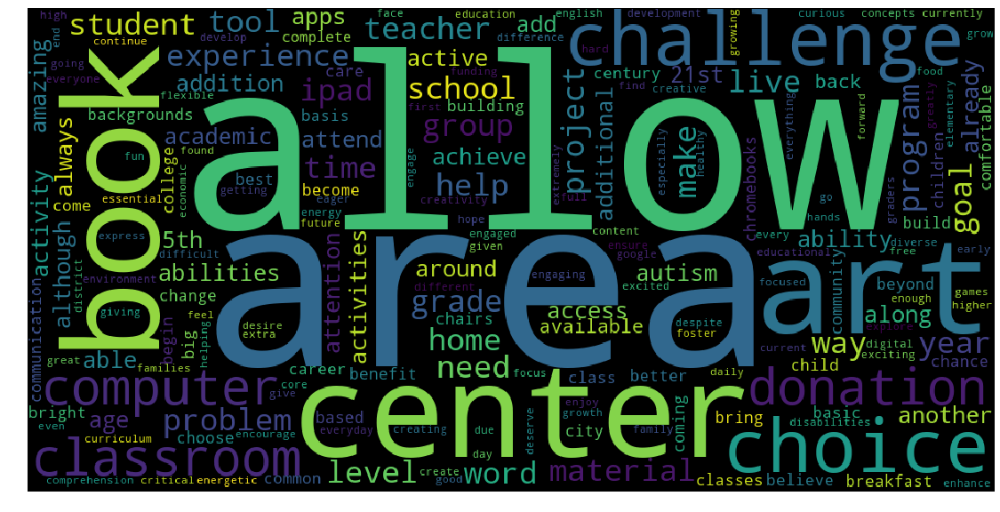

In [113]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS 
#convert list to string and generate
words_string=(" ").join(fp_words)
wordcloud = WordCloud(width = 1000, height = 500).generate(words_string)
plt.figure(figsize=(25,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# Box & PDF plot for False Positives

In [114]:
df = pd.DataFrame(list(price_for_test))
print(df.head(2))

        0
0   14.85
1  117.72


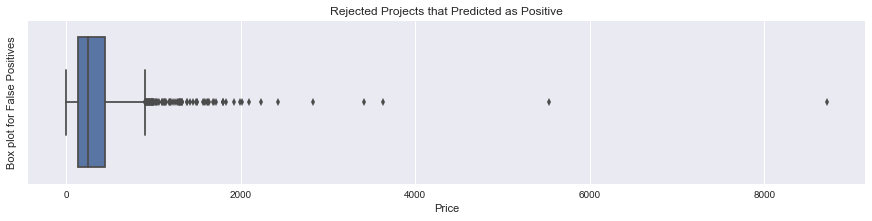

In [115]:
plt.figure(figsize=(15,3))
df1 = df.iloc[fp_index, : ]
sns.boxplot(df1.values)
plt.title("Rejected Projects that Predicted as Positive")
plt.ylabel("Box plot for False Positives")
plt.xlabel("Price")
plt.show()

In [116]:
df = pd.DataFrame(list(number_of_previously_posted_projects_dtrees))
df1 = df.iloc[fp_index, : ]

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



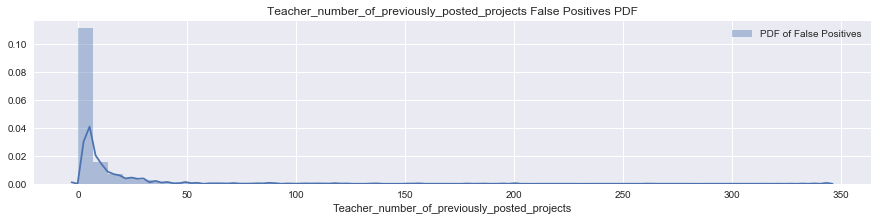

In [117]:
plt.figure(figsize=(15,3))
sns.distplot(df1.values, label="PDF of False Positives")
plt.title('Teacher_number_of_previously_posted_projects False Positives PDF')
plt.xlabel('Teacher_number_of_previously_posted_projects')
plt.legend()
plt.show()

# Set2 TFIDF W2V

In [118]:
from scipy.sparse import hstack
X_train = hstack((train_categories_one_hot , sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train,
                  teacher_prefix_categories_one_hot_train,tfidf_w2v_vectors_train,tfidf_w2v_vectors_titles_train, quantity_train,
                  prev_projects_train, price_train,title_word_count_train, 
                  essay_word_count_train, positive_intensity_train, negative_intensity_train,
                  neutral_intensity_train)).tocsr()
print(X_train.shape, y_train.shape)
print(type(X_train))

(73196, 706) (73196,)
<class 'scipy.sparse.csr.csr_matrix'>


In [119]:
X_test = hstack((test_categories_one_hot ,sub_categories_one_hot_test,school_state_categories_one_hot_test,project_grade_categories_one_hot_test,
                 teacher_prefix_categories_one_hot_test,tfidf_w2v_vectors_test, tfidf_w2v_vectors_titles_test, quantity_test,
                  prev_projects_test, price_test,title_word_count_test, 
                  essay_word_count_test, title_word_count_test, negative_intensity_test,
                  neutral_intensity_test)).tocsr()
print(X_test.shape)
print(type(X_test))

(36052, 706)
<class 'scipy.sparse.csr.csr_matrix'>


In [120]:
# X_cv = hstack((cv_categories_one_hot ,sub_categories_one_hot_cv,school_state_categories_one_hot_cv,project_grade_categories_one_hot_cv,
#                  teacher_prefix_categories_one_hot_cv,tfidf_w2v_vectors_cv, tfidf_w2v_vectors_titles_cv, quantity_cv,
#                  prev_projects_cv, price_cv, title_word_count_cv, 
#                   essay_word_count_cv ,positive_intensity_cv, negative_intensity_cv,
#                   neutral_intensity_cv)).tocsr()
# print(X_cv.shape, y_cv.shape)
# print(type(X_cv))

In [121]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
DT = DecisionTreeClassifier()

parameters = {'max_depth': [1, 3, 10, 30], 'min_samples_split': [5, 10, 100, 500]}

classifier_5 = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc',verbose=10,n_jobs=-1)
classifier_5.fit(X_train, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is depreca

GridSearchCV(cv=3, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [1, 3, 10, 30], 'min_samples_split': [5, 10, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [122]:
max_depth_best_param=classifier_5.best_params_['max_depth']
min_samples_split_best_param=classifier_5.best_params_['min_samples_split']
print(classifier_5.best_params_)

{'max_depth': 10, 'min_samples_split': 500}


In [123]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [124]:
x1 =  [1, 3, 10, 30]#min_sample_split
y1 = [5, 10, 100, 500]#max_depth
z1 = classifier_5.cv_results_['mean_test_score']

x2 = [1, 3, 10, 30] #min_sample_split
y2 = [5, 10, 100, 500] #max_depth
z2 = classifier_5.cv_results_['mean_train_score']


In [125]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'Cross Validation')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Train')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_sample_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

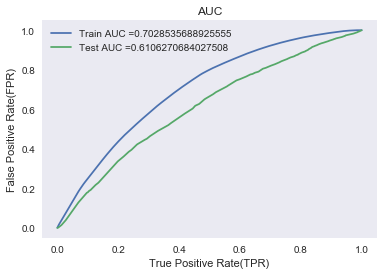

In [126]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier(max_depth = max_depth_best_param, min_samples_split = min_samples_split_best_param)
classifier.fit(X_train, y_train)

y_train_pred = batch_predict(classifier,X_train)    
y_test_pred = batch_predict(classifier,X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

# Confusion Matrix For Train & Test Data

For the Train Data
the maximum value of tpr*(1-fpr) 0.4211632999792407 for threshold 0.883
For the Test Data
the maximum value of tpr*(1-fpr) 0.33784456234209853 for threshold 0.883


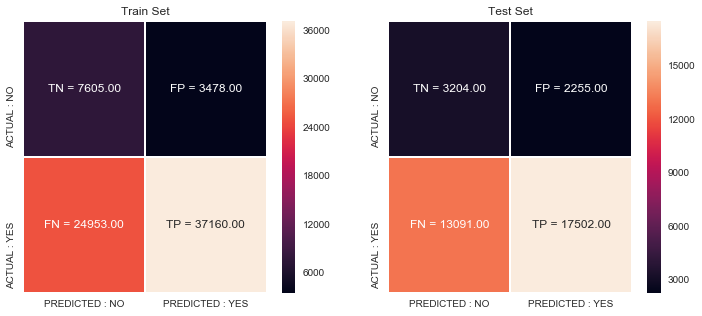

In [127]:
#https://www.quantinsti.com/blog/creating-heatmap-using-python-seaborn
import seaborn as sns; sns.set()
print("For the Train Data")
con_m_train = confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr))
print("For the Test Data")
con_m_test = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr))

key = (np.asarray([['TN','FP'], ['FN', 'TP']]))
fig, ax = plt.subplots(1,2, figsize=(12,5)) 

labels_train = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_m_train.flatten())])).reshape(2,2)
labels_test = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_m_test.flatten())])).reshape(2,2)

sns.heatmap(con_m_train, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'], yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_train, fmt = '', ax=ax[0])
sns.heatmap(con_m_test, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'], yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_test, fmt = '', ax=ax[1])

ax[0].set_title('Train Set')
ax[1].set_title('Test Set')

plt.show()

# False Positive Word Cloud

In [128]:
y_predicted=predict(y_test_pred, te_thresholds, test_fpr, test_tpr)
y_test=list(y_test[::])
y_predicted=list(y_predicted[::])
for x,y in zip(y_test,y_predicted):
    print(x,y)

the maximum value of tpr*(1-fpr) 0.33784456234209853 for threshold 0.883
1 1
1 0
1 1
1 1
1 0
0 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
0 1
0 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 1
0 0
1 0
0 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
0 0
1 1
1 1
1 1
0 0
1 1
1 1
1 0
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
0 0
1 1
0 0
1 1
1 0
1 1
0 0
0 0
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 1
0 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
0 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
0 1
1 1
1 0
1 1
1 0
1 0
1 0
0 0
1 1
0 1
1 0
0 0
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 0
1 1
1 1
0 0
1 0
1 0
1 1
1 1
0 0
1 1
1 0
1 0
1 0
1 1
1 0
0 0
0 0
1 1
1 0
0 0
1 1
1 0
0 0
1 1
1 0
1 1
1 0
0 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
0 1
1 0
0 1
0 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
0 1
1 1
1 1
1 0
0 1

0 0
1 0
1 0
1 0
0 0
1 0
1 1
1 0
1 1
1 0
1 1
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 0
0 0
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
0 1
1 1
1 0
1 0
0 0
1 0
1 1
1 1
1 0
1 1
1 0
0 1
1 1
1 1
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
0 0
1 1
1 0
1 1
1 1
1 1
0 0
0 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
0 1
0 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
0 1
1 1
1 1
0 0
1 1
1 0
1 1
0 0
1 0
0 1
0 0
0 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 0
0 0
1 1
0 1
1 1
1 1
1 1
1 1
1 0
1 0
0 1
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
0 0
0 0
0 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 1
1 1
0 0
0 1
1 1
1 0
0 0
0 0
1 1
1 1
1 0
0 1
1 0
0 0
0 0
1 0
1 1
1 1
1 1
1 1
1 0
0 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 0
0 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 1
0 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
0 1
1 0
0 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1


1 0
1 1
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
0 0
1 0
0 0
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
0 0
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
0 1
1 1
1 0
0 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
0 1
1 1
1 0
1 1
0 0
1 1
0 1
1 0
1 1
1 1
0 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 1
1 0
1 1
0 1
1 0
1 1
1 1
1 0
1 1
1 0
0 0
1 0
0 1
1 0
1 0
1 1
1 0
1 0
0 0
1 1
1 1
1 0
0 0
0 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
0 0
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 1
1 1
1 1
0 0
1 0
1 0
1 1
1 1
1 1
1 1
0 0
1 1
0 0
1 0
0 1
1 0
1 0
1 0
1 0
1 0
0 0
1 0
1 1
1 1
0 1
1 0
1 0
1 1
0 1
1 1
1 1
1 1
1 0
0 0
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 0
0 1
1 1
1 1
1 0
1 0
1 1
0 1
0 0
1 1
1 1
1 0
1 0
1 1
1 0
1 0
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
0 0
0 0
0 1
0 0
1 1
1 1
0 1
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 0
0 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0


1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 0
1 1
1 0
1 0
1 1
0 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
0 1
1 1
1 1
0 0
1 1
1 0
0 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
0 0
0 0
1 1
1 1
1 1
1 1
1 0
0 1
0 1
1 1
1 1
1 0
1 1
0 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
0 1
1 0
1 1
1 1
1 1
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
0 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
0 0
0 0
1 1
0 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 1
1 0
1 0
1 1
0 0
1 0
1 1
0 1
1 1
1 0
1 0
1 1
0 0
1 0
1 0
1 1
0 0
1 1
1 0
0 1
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
0 1
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
0 1
0 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 0
1 1
1 1
0 1
1 0
1 0
1 1
1 1
1 0
0 1
1 1
0 1
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
0 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
0 1
0 0
1 0


1 0
1 0
1 0
0 1
1 0
1 0
0 1
1 1
1 0
1 0
1 1
1 1
0 0
1 1
1 1
1 0
0 0
1 0
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 1
0 1
1 0
1 1
0 0
1 1
0 1
1 1
1 1
1 0
1 1
0 0
0 0
1 1
0 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
0 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
0 1
0 0
1 1
1 1
1 1
1 0
1 0
1 1
0 1
1 1
1 0
1 1
1 1
0 0
0 1
0 0
1 1
1 0
0 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 0
0 1
1 1
1 0
1 1
0 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
0 1
0 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
0 0
0 0
0 1
1 1
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 1
0 0
1 1
1 1
1 0
1 0
1 1
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
0 0
1 1
0 0
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
0 1
1 0
1 0
0 1
1 1
1 1
1 1
0 1
1 0
1 1
1 0
1 0


1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 0
1 0
1 1
1 0
0 0
0 0
1 0
1 1
1 1
1 1
1 0
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 1
0 1
0 0
1 1
1 1
1 0
0 0
1 1
0 1
1 0
1 1
0 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 0
0 1
1 0
1 1
1 1
1 0
0 1
0 1
0 1
1 1
1 1
1 1
1 1
0 1
1 0
1 1
1 1
0 1
1 0
1 0
1 0
1 1
1 1
0 1
1 0
1 0
0 1
1 0
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 0
1 0
0 0
0 0
0 0
1 0
1 0
1 1
1 0
1 1
1 0
0 0
1 1
1 0
1 1
1 1
1 1
1 0
0 1
0 1
1 1
1 0
1 0
1 1
0 0
1 1
0 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 0
0 0
1 0
0 0
1 0
1 0
1 1
1 0
1 1
1 0
1 1
0 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
0 1
0 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 0


1 1
1 0
1 0
1 1
1 1
1 0
0 0
1 1
1 0
1 0
1 1
0 0
1 1
1 0
1 0
0 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
0 0
1 1
1 0
1 0
1 1
1 1
1 1
0 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 1
0 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 1
0 1
1 1
0 1
1 1
0 0
1 0
0 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
0 0
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
0 1
0 1
1 0
1 0
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 1
0 1
1 1
1 1
1 0
1 1
1 0
1 0
1 0
0 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
0 1
0 1
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 0
0 0
1 0
1 1
0 1
1 1
1 1
1 0
1 1
1 0
1 1
0 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 1
0 0
0 1
1 1
1 1
1 1
0 0
1 1
0 1
1 0
1 0
1 1
1 1
1 0
0 0
1 0
1 0
1 1
0 0
1 1
0 1
0 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
0 1
1 0
1 1
0 0
1 1
0 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0


0 1
1 1
1 1
1 0
1 0
1 0
1 0
0 0
1 0
0 0
0 1
1 1
1 1
1 0
1 0
0 0
1 1
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 0
0 1
1 1
0 1
1 0
1 1
0 1
1 0
1 1
1 1
0 0
1 1
1 0
1 0
0 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 1
0 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 0
0 1
1 1
0 0
1 1
0 0
1 1
0 0
1 0
0 1
1 1
1 0
1 1
1 0
1 0
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
0 0
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 0
0 0
1 1
1 1
1 1
1 1
0 0
0 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
0 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
0 0
1 0
1 0
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
0 0
0 1
0 1
1 0
0 1
1 1
1 0
0 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 1
0 0
1 0
1 1
1 0
0 0
1 0
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
0 0
1 1
1 0
1 0
1 1
1 0
1 0
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 1
0 0
1 0
0 0
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
0 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1


1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
0 0
1 1
0 0
1 1
1 1
1 1
1 1
0 1
1 1
1 0
1 1
1 0
1 0
1 1
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
0 1
0 0
1 1
1 0
0 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
0 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
0 0
1 0
1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
0 0
1 1
1 1
1 1
0 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 1
0 1
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 1
1 1
1 0
0 0
1 0
1 1
1 1
1 1
1 0
1 1
0 0
0 0
0 0
1 1
1 0
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
0 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 0
1 1
1 0
0 0
0 0
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 0
1 0
0 0
1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 1
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 1
1 0
1 1
0 1
1 1
1 1
0 0
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
0 0
1 0
0 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 0
0 1
1 0
0 0
0 0
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0


1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 1
0 1
0 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 1
0 0
0 0
0 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 0
0 1
1 0
1 1
0 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
0 0
1 1
1 1
1 0
1 0
0 1
1 1
1 0
0 0
0 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
0 0
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
0 1
1 0
0 0
0 0
1 1
1 0
1 1
0 0
1 0
1 1
1 1
1 0
1 0
0 0
1 0
0 1
0 0
1 1
0 0
0 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
0 0
1 0
1 0
1 0
1 0
0 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
0 1
0 0
0 1
1 1
1 0
1 1
1 0
1 1
0 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 1
0 0
1 0
1 0
1 0
1 0
1 0
0 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 0
1 1
0 1
0 0
1 1
1 1
0 0
1 0
1 0
1 1
0 1
1 0
0 1
1 1
0 0
1 0
1 1
1 1
0 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
0 0
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
0 0
1 0
0 0
0 1
1 0
1 0
1 0
1 1
1 1
0 1
1 1
1 0
1 0
1 0
0 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
0 1
1 0
1 1
0 0
1 0


1 1
1 1
0 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
0 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
0 0
0 0
1 0
1 1
0 1
1 1
1 1
0 0
1 0
1 1
1 1
0 1
1 1
1 1
1 1
1 0
1 0
1 0
1 0
0 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 0
0 0
1 0
1 0
0 1
1 0
1 0
1 1
1 1
1 0
0 1
1 1
0 0
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 0
0 1
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
0 1
1 0
0 0
1 1
1 0
1 0
1 0
1 1
0 0
1 1
1 1
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
0 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
0 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 0
1 0
1 0
1 0
1 1
0 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 0
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 0
1 0
1 0
0 1
0 0
1 1
0 0
1 1
1 1
1 0
1 1
0 0
1 1
1 1
0 1
1 1
0 0
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1


1 1
1 0
1 0
0 1
1 1
1 1
1 1
1 1
1 1
0 1
0 0
1 0
0 1
1 1
0 0
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 1
0 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
0 0
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
0 0
1 1
1 1
0 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
0 0
1 1
1 1
1 1
0 0
0 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 0
1 0
0 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1
0 0
1 1
1 1
1 1
0 0
1 1
1 1
1 1
0 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
1 1
0 0
1 0
0 0
1 1
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
0 0
1 0
1 1
1 1
1 1
0 0
1 0
1 1
0 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
0 0
0 1
1 1
1 1
1 0
1 1
1 0
1 1
0 0
1 1
0 1
0 1
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
0 1
1 1
1 1
1 1
1 1
1 0
1 1
0 0
0 1
1 1
1 0
1 0
1 0
1 1
0 0
0 0
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
0 0
1 1


1 0
1 1
1 1
0 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 0
1 1
1 0
1 1
1 0
1 1
0 0
0 1
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 0
0 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 1
1 1
0 0
1 0
1 1
0 1
1 1
1 0
0 0
0 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
0 0
1 1
1 0
1 0
1 1
1 1
1 1
0 0
1 0
0 0
1 1
1 1
1 0
1 0
1 1
1 0
0 0
1 0
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 1
0 0
1 0
1 1
1 0
1 1
1 1
1 1
1 1
0 0
1 1
1 1
1 0
1 0
0 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
0 1
1 0
1 1
0 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
0 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 0
0 1
0 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
0 0
1 1
1 1
1 0
1 1
0 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
0 0
1 0
0 0
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 0
1 1
0 0
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 1


0 1
1 1
1 0
0 0
1 0
1 0
0 1
1 0
1 1
1 0
1 1
1 1
1 0
1 1
1 1
0 1
1 0
1 0
1 1
1 0
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 0
0 0
1 1
0 0
1 1
1 1
1 1
1 1
1 0
1 0
1 1
0 1
1 0
1 0
1 0
1 1
1 1
0 0
1 1
1 1
1 0
1 1
1 0
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
0 1
1 0
1 1
1 1
0 1
1 0
1 0
1 0
1 1
1 1
1 0
1 0
0 1
1 0
1 1
0 1
1 0
0 0
1 1
1 1
1 1
1 1
1 0
0 0
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0
1 0
0 0
1 0
1 0
1 1
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 1
1 1
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 1
1 1
1 0
1 1
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 1
1 0
1 0
1 0
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
0 1
0 1
1 1
1 0
1 1
0 1
0 1
1 1
1 1
1 0
0 0
1 0
0 0
1 0
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 0
0 1
1 1
1 0
0 1
1 0
1 1
1 1
1 0
1 1
1 1
0 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
1 1
1 0
1 0
1 0
1 0
1 1
1 0
1 1
1 0
0 0
1 0
0 0
1 0
1 1
0 1
1 1
1 1
1 1
1 1
1 0
1 0
1 1
1 0
1 1
1 1
1 0
0 1
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 0
1 1
1 0
1 0


In [129]:
bow_test = test_text_bow.todense()
print(bow_test.shape)
len(BOW_feat_essay)

(36052, 14156)


14156

In [130]:
fp_index = []
fp_count = 0

for i in range(len(y_test_pred)):
    if y_test[i] == 0 and y_predicted[i]==1:
        fp_index.append(i)
        fp_count = fp_count + 1 
    else :
        pass
print(fp_count)
print(fp_index[0:10])

2255
[25, 26, 78, 132, 142, 150, 159, 177, 207, 216]


In [131]:
df1 = pd.DataFrame(test_text_bow.todense()) 
df1_final = df1.iloc[fp_index,:]
print(df1_final.shape)

(2255, 14156)


In [132]:
best_indices = []

for j in range(12059):    
    s = df1_final[j].sum()
    if s >= 100 :
        best_indices.append(j)
    else :
        continue   
print(len(best_indices))
print(best_indices[0:10])

438
[4, 92, 180, 249, 250, 252, 281, 298, 353, 388]


In [133]:
fp_words = []

for a in best_indices :
    fp_words.append(str(BOW_feat_essay[a]))
print(fp_words[0:10])

['100', '21st', '5th', 'abilities', 'ability', 'able', 'academic', 'access', 'achieve', 'active']


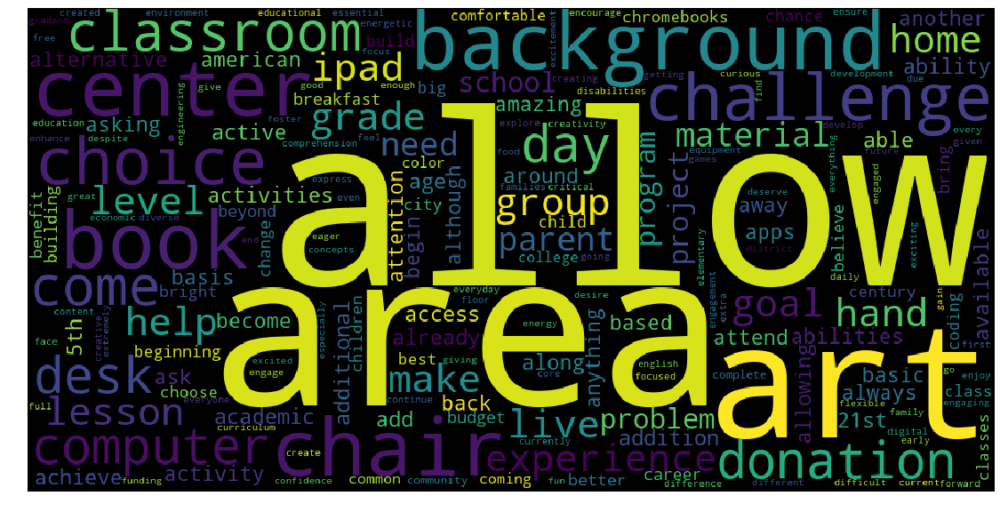

In [134]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS 
#convert list to string and generate
words_string=(" ").join(fp_words)
wordcloud = WordCloud(width = 1000, height = 500).generate(words_string)
plt.figure(figsize=(25,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# Box & PDF plot for False Positives

In [135]:
df = pd.DataFrame(list(price_for_test))
print(df.head(2))

        0
0   14.85
1  117.72


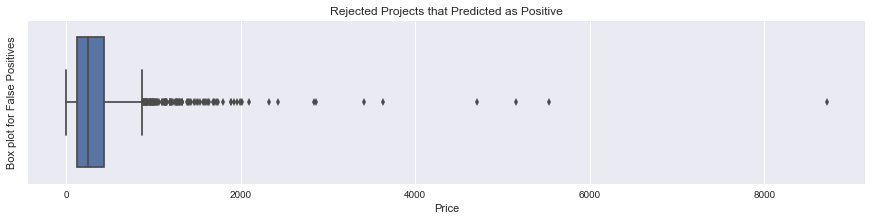

In [136]:
plt.figure(figsize=(15,3))
df1 = df.iloc[fp_index, : ]
sns.boxplot(df1.values)
plt.title("Rejected Projects that Predicted as Positive")
plt.ylabel("Box plot for False Positives")
plt.xlabel("Price")
plt.show()

In [137]:
df = pd.DataFrame(list(number_of_previously_posted_projects_dtrees))
df1 = df.iloc[fp_index, : ]

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



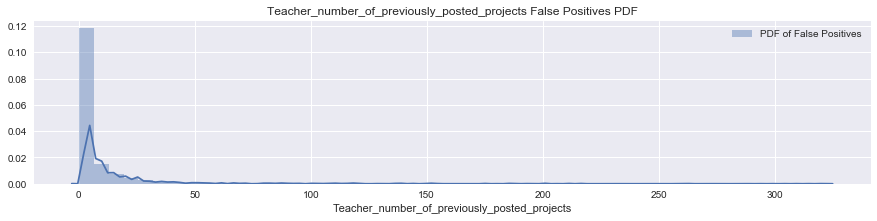

In [138]:
plt.figure(figsize=(15,3))
sns.distplot(df1.values, label="PDF of False Positives")
plt.title('Teacher_number_of_previously_posted_projects False Positives PDF')
plt.xlabel('Teacher_number_of_previously_posted_projects')
plt.legend()
plt.show()

# Task 2

In [139]:
from scipy.sparse import hstack
X_train = hstack((train_categories_one_hot , sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train,
                  teacher_prefix_categories_one_hot_train,text_tfidf_train,title_tfidf_train, quantity_train,
                  prev_projects_train, price_train,title_word_count_train, 
                  essay_word_count_train, positive_intensity_train, negative_intensity_train,
                  neutral_intensity_train)).tocsr()
print(X_train.shape, y_train.shape)
print(type(X_train))

(73196, 7652) (73196,)
<class 'scipy.sparse.csr.csr_matrix'>


In [140]:
X_test = hstack((test_categories_one_hot ,sub_categories_one_hot_test,school_state_categories_one_hot_test,project_grade_categories_one_hot_test,
                 teacher_prefix_categories_one_hot_test,text_tfidf_test, title_tfidf_test, quantity_test,
                  prev_projects_test, price_test,title_word_count_test, 
                  essay_word_count_test, title_word_count_test, negative_intensity_test,
                  neutral_intensity_test)).tocsr()
print(X_test.shape)
print(type(X_test))

(36052, 7652)
<class 'scipy.sparse.csr.csr_matrix'>


In [141]:
## #https://stackoverflow.com/questions/47111434/randomforestregressor-and-feature-importances-error

# from sklearn.ensemble import RandomForestClassifier
# from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
def selectKImportance(model, X, k):
    return X[:,model.feature_importances_.argsort()[::-1][:k]]

In [142]:
dt_tfidf_imp_feature_testModel = DecisionTreeClassifier(class_weight='balanced')
dt_tfidf_imp_feature_testModel.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [143]:
nonZeroFeatures=0
for i in range (len(dt_tfidf_imp_feature_testModel.feature_importances_)):
    if(dt_tfidf_imp_feature_testModel.feature_importances_[i]>0):
        nonZeroFeatures=nonZeroFeatures+1

In [144]:
x_train_impFeatureDataset1=selectKImportance(dt_tfidf_imp_feature_testModel,X_train,nonZeroFeatures)
x_test_impFeatureDataset1=selectKImportance(dt_tfidf_imp_feature_testModel,X_test,nonZeroFeatures)

In [145]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
DT = DecisionTreeClassifier()

parameters = {'max_depth': [1, 3, 10, 30], 'min_samples_split': [5, 10, 100, 500]}

classifier_5 = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc',verbose=10,n_jobs=-1)
classifier_5.fit(x_train_impFeatureDataset1, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

C:\Anaconda3\lib\site-packages\sklearn\externals\joblib\numpy_pickle.py:93: DeprecationWarning:

tostring() is deprecated. Use tobytes() instead.

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   

GridSearchCV(cv=3, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [1, 3, 10, 30], 'min_samples_split': [5, 10, 100, 500]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=10)

In [146]:
max_depth_best_param=classifier_5.best_params_['max_depth']
min_samples_split_best_param=classifier_5.best_params_['min_samples_split']
print(classifier_5.best_params_)

{'max_depth': 10, 'min_samples_split': 500}


In [147]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [148]:
x1 = [5, 10, 100, 500] #min_sample_split
y1 =[1, 3, 10, 30] #max_depth
z1 = classifier_5.cv_results_['mean_test_score']

x2 = [5, 10, 100, 500] #min_sample_split
y2 = [1, 3, 10, 30] #max_depth
z2 = classifier_5.cv_results_['mean_train_score']


In [149]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'Cross Validation')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Train')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_sample_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

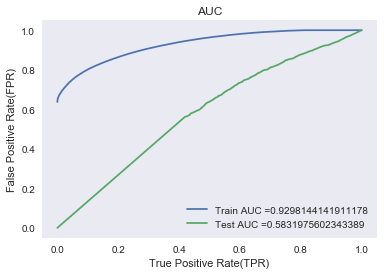

In [150]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier(min_samples_split = min_samples_split_best_param)
classifier.fit(x_train_impFeatureDataset1, y_train)

y_train_pred = batch_predict(classifier,x_train_impFeatureDataset1)    
y_test_pred = batch_predict(classifier,x_test_impFeatureDataset1)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)")
plt.title("AUC")
plt.grid()
plt.show()

# Confusion Matrix For Train & Test Data

For the Train Data
the maximum value of tpr*(1-fpr) 0.7214974194470031 for threshold 0.702
For the Test Data
the maximum value of tpr*(1-fpr) 0.32595387646401114 for threshold 0.936


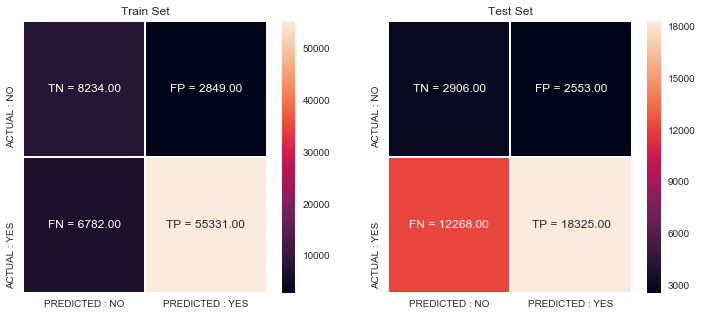

In [151]:
#https://www.quantinsti.com/blog/creating-heatmap-using-python-seaborn
import seaborn as sns; sns.set()
print("For the Train Data")
con_m_train = confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr))
print("For the Test Data")
con_m_test = confusion_matrix(y_test, predict(y_test_pred, te_thresholds, test_fpr, test_tpr))

key = (np.asarray([['TN','FP'], ['FN', 'TP']]))
fig, ax = plt.subplots(1,2, figsize=(12,5)) 

labels_train = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_m_train.flatten())])).reshape(2,2)
labels_test = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_m_test.flatten())])).reshape(2,2)

sns.heatmap(con_m_train, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'], yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_train, fmt = '', ax=ax[0])
sns.heatmap(con_m_test, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'], yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_test, fmt = '', ax=ax[1])

ax[0].set_title('Train Set')
ax[1].set_title('Test Set')

plt.show()

In [152]:
vectorizer = CountVectorizer(min_df=10)
vectorizer.fit(preprocessed_essays_train)
test_text_bow = vectorizer.transform(preprocessed_essays_test)
print("Shape of matrix after BOW encodig ",test_text_bow.shape)
# cv_text_bow = vectorizer.transform(preprocessed_essays_cv)
# print("Shape of matrix after BOW encodig ",cv_text_bow.shape)
BOW_feat_essay= vectorizer.get_feature_names() #for decision tree

Shape of matrix after BOW encodig  (36052, 14156)


In [153]:
y_predicted=predict(y_test_pred, te_thresholds, test_fpr, test_tpr)
y_test=list(y_test[::])
y_predicted=list(y_predicted[::])

the maximum value of tpr*(1-fpr) 0.32595387646401114 for threshold 0.936


In [154]:
bow_test = test_text_bow.todense()
print(bow_test.shape)
len(BOW_feat_essay)

(36052, 14156)


14156

In [155]:
fp_index = []
fp_count = 0

for i in range(len(y_test_pred)):
    if y_test[i] == 0 and y_predicted[i]==1:
        fp_index.append(i)
        fp_count = fp_count + 1 
    else :
        pass
print(fp_count)
print(fp_index[0:10])

2553
[5, 26, 47, 78, 93, 95, 159, 161, 177, 183]


In [156]:
df1 = pd.DataFrame(test_text_bow.todense()) 
df1_final = df1.iloc[fp_index,:]
print(df1_final.shape)

(2553, 14156)


In [157]:
best_indices = []

for j in tqdm(range(df1_final.shape[1])):    
    s = df1_final[j].sum()
    if s >= 100 :
        best_indices.append(j)
    else :
        continue   
print(len(best_indices))
print(best_indices[0:10])

100%|██████████████████████████████████████████████████████████████████████████| 14156/14156 [00:05<00:00, 2517.97it/s]

592
[4, 92, 180, 249, 250, 252, 281, 282, 298, 353]


In [158]:
fp_words = []

for a in best_indices :
    fp_words.append(str(BOW_feat_essay[a]))
print(fp_words[0:10])

['100', '21st', '5th', 'abilities', 'ability', 'able', 'academic', 'academically', 'access', 'achieve']


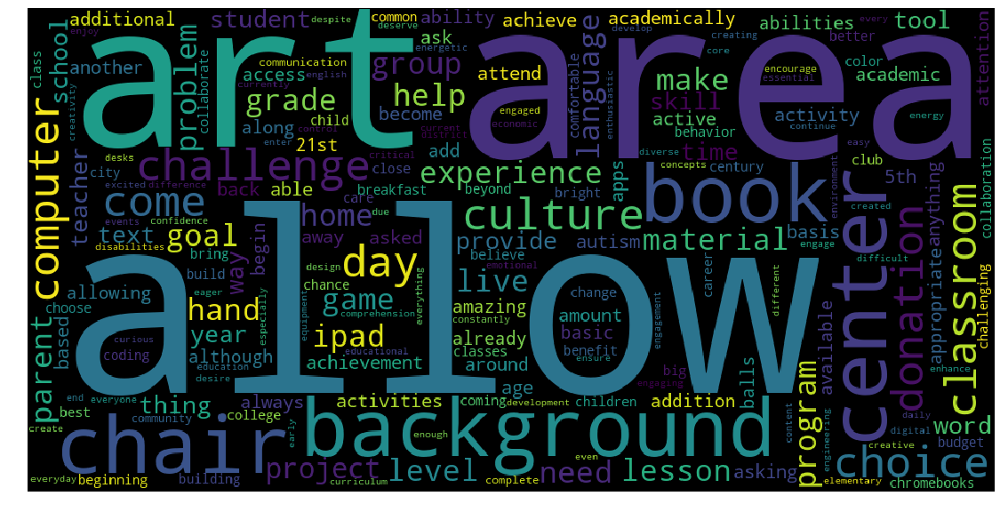

In [159]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS 
#convert list to string and generate
words_string=(" ").join(fp_words)
wordcloud = WordCloud(width = 1000, height = 500).generate(words_string)
plt.figure(figsize=(25,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# Box & PDF plot for False Positives

In [160]:
df = pd.DataFrame(list(price_for_test))
print(df.head(2))

        0
0   14.85
1  117.72


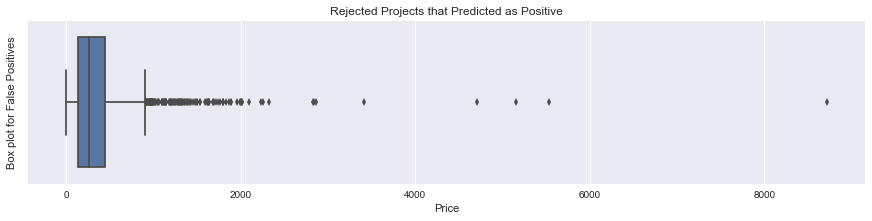

In [161]:
plt.figure(figsize=(15,3))
df1 = df.iloc[fp_index, : ]
sns.boxplot(df1.values)
plt.title("Rejected Projects that Predicted as Positive")
plt.ylabel("Box plot for False Positives")
plt.xlabel("Price")
plt.show()

In [162]:
df = pd.DataFrame(list(number_of_previously_posted_projects_dtrees))
df1 = df.iloc[fp_index, : ]

C:\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



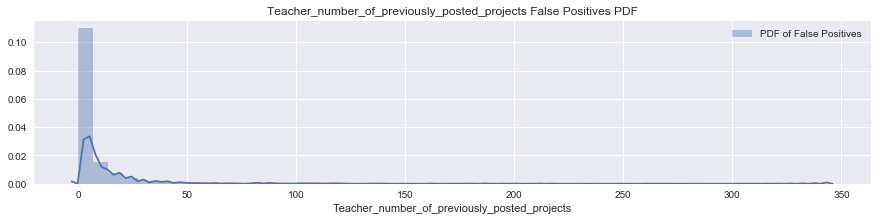

In [163]:
plt.figure(figsize=(15,3))
sns.distplot(df1.values, label="PDF of False Positives")
plt.title('Teacher_number_of_previously_posted_projects False Positives PDF')
plt.xlabel('Teacher_number_of_previously_posted_projects')
plt.legend()
plt.show()

# Conclusion

In [165]:
# Please compare all your models using Prettytable library
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
TB = PrettyTable()
TB.field_names = ["Model", "Hyperparameter", "Train_AUC", "Test_Auc"]
TB.title = "Decision Tree"
TB.add_row(["TFIDF", "Depth:10 | Samp_Split:500", 0.6610,0.63480])
TB.add_row(["TFIDF-W2V", "Depth:10 | Samp_Split:500", 0.7028, 0.6106])
TB.add_row(["TFIDF-IMP-FEATURES", "Depth:10 | Samp_Split:500", 0.9298, 0.5831])
print(TB)

+-----------------------------------------------------------------------+
|                             Decision Tree                             |
+--------------------+---------------------------+-----------+----------+
|       Model        |       Hyperparameter      | Train_AUC | Test_Auc |
+--------------------+---------------------------+-----------+----------+
|       TFIDF        | Depth:10 | Samp_Split:500 |   0.661   |  0.6348  |
|     TFIDF-W2V      | Depth:10 | Samp_Split:500 |   0.7028  |  0.6106  |
| TFIDF-IMP-FEATURES | Depth:10 | Samp_Split:500 |   0.9298  |  0.5831  |
+--------------------+---------------------------+-----------+----------+
